# Master in Applied Artificial Intelligence

## Course: *Computer Vision for Images and Video*

### **7.2 Google Colab** - Feature Extraction Algorithms

---

**Institution:** Tecnológico de Monterrey

**Instructors:** Gilberto Ochoa Ruiz, Daniel Flores Araiza, Ma. del Refugio Meléndez Alfaro

**Authors (Team 38):** 

|  FULL NAME                      |     STUDENT ID    | 
| :--------------------------:    |:-----------------:|
| Alejandro Díaz Villagómez       |  A01276769        | 
| Carlos Rodrigo Sánchez Sierra   |  A01424454        | 
| Emiliano Saucedo Arriola        |  A01659258        | 

**Date:** October 26th, 2025

---

# 7.2. Image Matching

## Table of Contents
1. [Libraries](#libraries)
1. [ORB Matching](#orb)
1. [SIFT Matching](#sift)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [1]:
import cv2 
import matplotlib.pyplot as plt
import numpy as np

# ORB (Oriented FAST and Rotated BRIEF) <a class="anchor" id="orb" ></a>

- Developed at OpenCV labs by Ethan Rublee, Vincent Rabaud, Kurt Konolige, and Gary R. Bradski in 2011
- Efficient and viable alternative to SIFT and SURF (patented algorithms)
- ORB is free to use
- Feature detection
- ORB builds on FAST keypoint detector + BRIEF descriptor

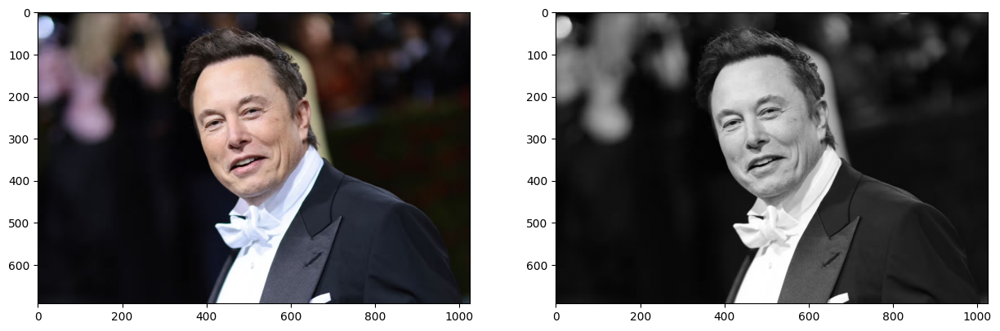

In [2]:
#reading image
img = cv2.imread('data/elon_1.jpg')  
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")

### Create test image by adding Scale Invariance and Rotational Invariance

In [3]:
test_image = cv2.pyrDown(img_color)
test_image = cv2.pyrDown(test_image)
num_rows, num_cols = test_image.shape[:2]

rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
test_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))

test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

### Display traning image and testing image

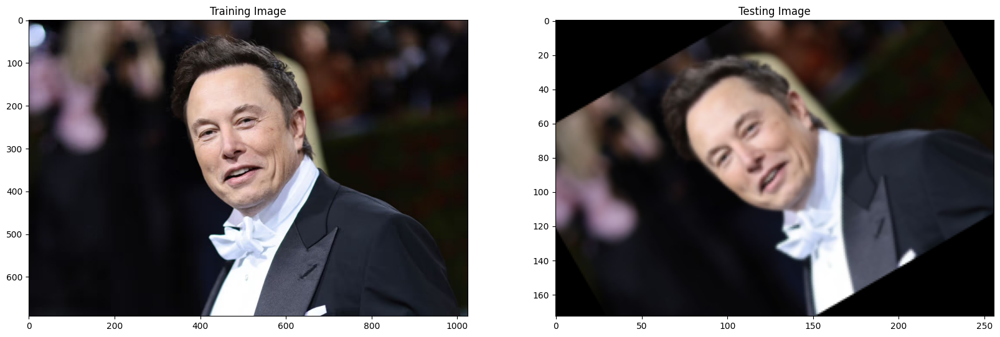

In [4]:
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Training Image")
plots[0].imshow(img_color)

plots[1].set_title("Testing Image")
plots[1].imshow(test_image)

### ORB

In [5]:
orb = cv2.ORB_create()

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  329


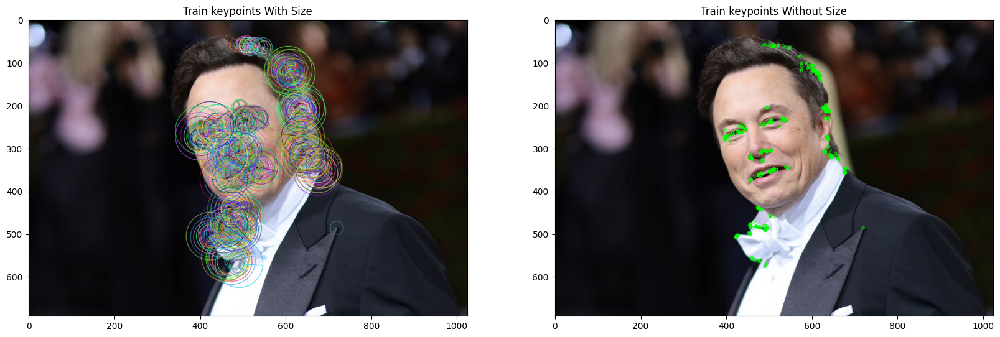

In [6]:
train_keypoints, train_descriptor = orb.detectAndCompute(img_color, None)
test_keypoints, test_descriptor = orb.detectAndCompute(test_gray, None)

keypoints_without_size = np.copy(img_color)
keypoints_with_size = np.copy(img_color)

cv2.drawKeypoints(img_color, train_keypoints, keypoints_without_size, color = (0, 255, 0))

cv2.drawKeypoints(img_color, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))

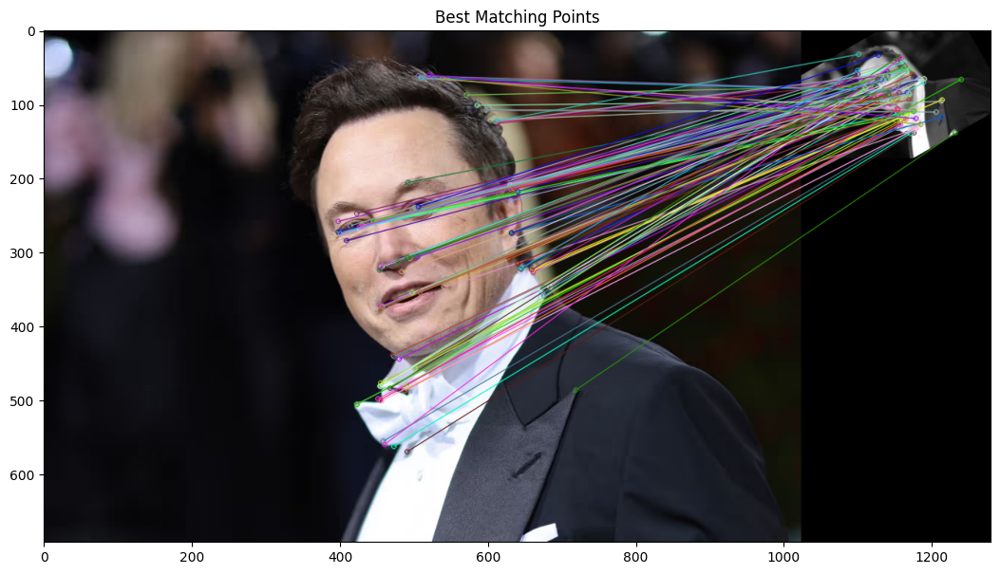


Number of Matching Keypoints Between The Training and Query Images:  106


In [7]:

# Create a Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the test image
matches = bf.match(train_descriptor, test_descriptor)

# The matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(img_color, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)

# Display the best matching points
plt.rcParams['figure.figsize'] = [14.0, 7.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

## SIFT Matching (Scale Invariant Feature Transform) <a class="anchor" id="sift" ></a>

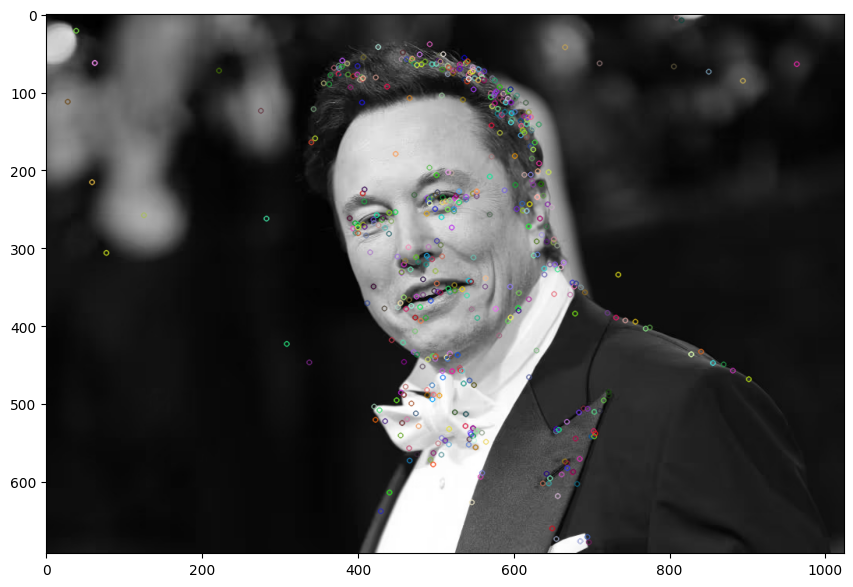

In [8]:
img1 = cv2.imread('data/elon_1.jpg')  
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

#keypoints
sift = cv2.SIFT_create()
keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)

img_1 = cv2.drawKeypoints(gray1,keypoints_1,img1)
plt.imshow(img_1)

### Matching different images

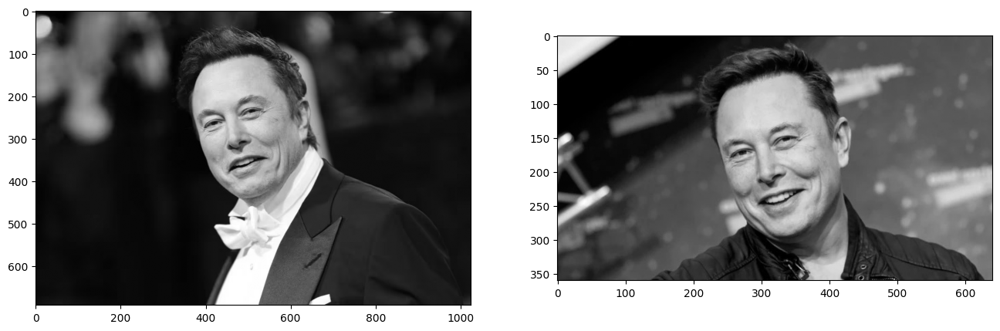

In [9]:
# read images
img1 = cv2.imread('data/elon_1.jpg')  
img2 = cv2.imread('data/elon_2.jpg') 

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

figure, ax = plt.subplots(1, 2, figsize=(16, 8))

ax[0].imshow(img1, cmap='gray')
ax[1].imshow(img2, cmap='gray')

### Extracting Keypoints with SIFT

In [10]:
#sift
sift = cv2.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

len(keypoints_1), len(keypoints_2)

(501, 417)

### Feature Matching

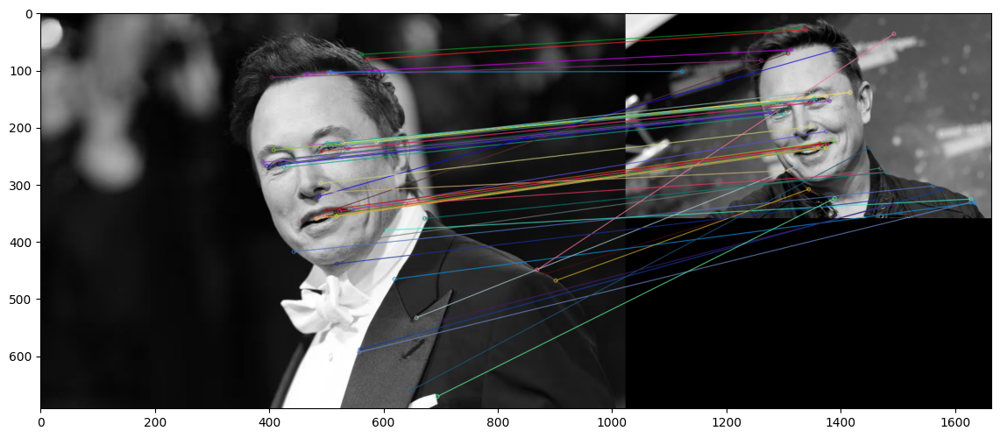

(<matplotlib.image.AxesImage at 0x168ca8800>, None)

In [11]:
#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1,descriptors_2)
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)
plt.imshow(img3),plt.show()

# > Solution

**Research Background**

* **Feature Detection and Matching: Harris, SIFT, and ORB**

    Feature detection and matching constitute fundamental processes in computer vision, enabling applications such as image alignment, object recognition, and 3D reconstruction. These techniques identify distinctive points or regions within images that can be reliably detected across different viewing conditions. The Harris corner detector, introduced by Harris and Stephens (1988), represents one of the earliest and most influential methods for identifying interest points in images. This algorithm detects corners by analyzing the local intensity variations through the computation of a structure tensor, which captures the gradient information in a small neighborhood around each pixel. While Harris corners exhibit strong invariance to rotation and are computationally efficient, they lack scale invariance, meaning they may fail to detect the same features when images are captured at different distances or resolutions (Schmid et al., 2000). This limitation becomes particularly evident in matching scenarios where images undergo significant scale transformations.

    To address the scale invariance problem, Lowe (2004) developed the Scale-Invariant Feature Transform (SIFT), which revolutionized feature detection by introducing a multi-scale approach. SIFT constructs a scale-space representation of the image using Difference-of-Gaussian (DoG) functions, detecting stable keypoints across different scales and orientations. Each keypoint is then described by a 128-dimensional descriptor computed from the gradient orientations in its surrounding region, providing robustness against illumination changes, rotation, and scale variations. The descriptors are designed to be distinctive enough for reliable matching while maintaining invariance to common image transformations. Although SIFT demonstrates superior performance in matching tasks under challenging conditions, its computational complexity and high-dimensional descriptors can be prohibitive for real-time applications (Bay et al., 2006).

    The Oriented FAST and Rotated BRIEF (ORB) descriptor, proposed by Rublee et al. (2011), emerged as an efficient alternative to SIFT, particularly suitable for resource-constrained environments and real-time applications. ORB combines the FAST (Features from Accelerated Segment Test) corner detector with a modified version of the BRIEF (Binary Robust Independent Elementary Features) descriptor, incorporating orientation compensation to achieve rotation invariance. Unlike SIFT's floating-point descriptor, ORB produces binary descriptors that can be compared using efficient Hamming distance calculations, resulting in significantly faster matching operations. While ORB sacrifices some robustness to scale and illumination changes compared to SIFT, it offers a compelling trade-off between performance and computational efficiency, making it particularly attractive for mobile and embedded vision applications (Rublee et al., 2011). Understanding the strengths and limitations of these different approaches is essential for selecting appropriate feature detection methods based on specific application requirements and constraints.

**References**

- Bay, H., Tuytelaars, T., & Van Gool, L. (2006). SURF: Speeded up robust features. In *European Conference on Computer Vision* (pp. 404-417). Springer.

- Harris, C., & Stephens, M. (1988). A combined corner and edge detector. In *Alvey Vision Conference* (Vol. 15, No. 50, pp. 10-5244).

- Lowe, D. G. (2004). Distinctive image features from scale-invariant keypoints. *International Journal of Computer Vision, 60*(2), 91-110.

- Rublee, E., Rabaud, V., Konolige, K., & Bradski, G. (2011). ORB: An efficient alternative to SIFT or SURF. In *2011 International Conference on Computer Vision* (pp. 2564-2571). IEEE.

- Schmid, C., Mohr, R., & Bauckhage, C. (2000). Evaluation of interest point detectors. *International Journal of Computer Vision, 37*(2), 151-172.

In [12]:
def load_image_pair(img1_path, img2_path):
    """Load a pair of images and convert to grayscale"""
    img1 = cv2.imread(img1_path)
    img2 = cv2.imread(img2_path)
    
    img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    
    img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
    img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
    
    return img1_gray, img2_gray, img1_rgb, img2_rgb

In [13]:
def detect_and_match_harris_sift(img1_gray, img2_gray):
    """
    Detect Harris corners and describe them using SIFT descriptors
    """
    # Harris corner detection
    harris1 = cv2.cornerHarris(img1_gray, blockSize=2, ksize=3, k=0.04)
    harris2 = cv2.cornerHarris(img2_gray, blockSize=2, ksize=3, k=0.04)
    
    # Threshold for corner detection
    harris1 = cv2.dilate(harris1, None)
    harris2 = cv2.dilate(harris2, None)
    
    # Create keypoints from Harris corners
    keypoints1 = []
    keypoints2 = []
    
    threshold = 0.01 * harris1.max()
    for i in range(harris1.shape[0]):
        for j in range(harris1.shape[1]):
            if harris1[i, j] > threshold:
                keypoints1.append(cv2.KeyPoint(float(j), float(i), 1))
    
    threshold = 0.01 * harris2.max()
    for i in range(harris2.shape[0]):
        for j in range(harris2.shape[1]):
            if harris2[i, j] > threshold:
                keypoints2.append(cv2.KeyPoint(float(j), float(i), 1))
    
    # Use SIFT to compute descriptors for Harris keypoints
    sift = cv2.SIFT_create()
    keypoints1, descriptors1 = sift.compute(img1_gray, keypoints1)
    keypoints2, descriptors2 = sift.compute(img2_gray, keypoints2)
    
    # Match descriptors
    if descriptors1 is not None and descriptors2 is not None:
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
        matches = bf.match(descriptors1, descriptors2)
        matches = sorted(matches, key=lambda x: x.distance)
    else:
        matches = []
    
    return keypoints1, keypoints2, matches

In [14]:
def detect_and_match_sift(img1_gray, img2_gray):
    """
    Detect and match features using SIFT
    """
    sift = cv2.SIFT_create()
    
    keypoints1, descriptors1 = sift.detectAndCompute(img1_gray, None)
    keypoints2, descriptors2 = sift.detectAndCompute(img2_gray, None)
    
    # Match descriptors
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches = bf.match(descriptors1, descriptors2)
    matches = sorted(matches, key=lambda x: x.distance)
    
    return keypoints1, keypoints2, matches

In [15]:
def detect_and_match_orb(img1_gray, img2_gray):
    """
    Detect and match features using ORB
    """
    orb = cv2.ORB_create(nfeatures=2000)
    
    keypoints1, descriptors1 = orb.detectAndCompute(img1_gray, None)
    keypoints2, descriptors2 = orb.detectAndCompute(img2_gray, None)
    
    # Match descriptors
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(descriptors1, descriptors2)
    matches = sorted(matches, key=lambda x: x.distance)
    
    return keypoints1, keypoints2, matches

In [16]:
def visualize_matches(img1_rgb, img2_rgb, kp1, kp2, matches, method_name, num_matches=50):
    """
    Visualize feature matches between two images
    """
    img_matches = cv2.drawMatches(
        img1_rgb, kp1, 
        img2_rgb, kp2, 
        matches[:num_matches], 
        None, 
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )
    
    plt.figure(figsize=(16, 8))
    plt.imshow(img_matches)
    plt.title(f'{method_name} - Top {num_matches} Matches (Total: {len(matches)} matches)', fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

In [17]:
def compare_methods(img1_gray, img2_gray, img1_rgb, img2_rgb, pair_name):
    """
    Compare all three methods on a given image pair
    """
    print(f"\n{'='*80}")
    print(f"ANALYZING: {pair_name}")
    print(f"{'='*80}\n")
    
    # Harris + SIFT
    kp1_harris, kp2_harris, matches_harris = detect_and_match_harris_sift(img1_gray, img2_gray)
    # Pure SIFT
    kp1_sift, kp2_sift, matches_sift = detect_and_match_sift(img1_gray, img2_gray)
    # ORB
    kp1_orb, kp2_orb, matches_orb = detect_and_match_orb(img1_gray, img2_gray)
    
    # Visualize results
    visualize_matches(img1_rgb, img2_rgb, kp1_harris, kp2_harris, matches_harris, 
                     f"{pair_name} - Harris + SIFT")
    visualize_matches(img1_rgb, img2_rgb, kp1_sift, kp2_sift, matches_sift, 
                     f"{pair_name} - SIFT")
    visualize_matches(img1_rgb, img2_rgb, kp1_orb, kp2_orb, matches_orb, 
                     f"{pair_name} - ORB")
    
    # Summary comparison
    results = {
        'Method': ['Harris + SIFT', 'SIFT', 'ORB'],
        'Keypoints (Img1)': [len(kp1_harris), len(kp1_sift), len(kp1_orb)],
        'Keypoints (Img2)': [len(kp2_harris), len(kp2_sift), len(kp2_orb)],
        'Total Matches': [len(matches_harris), len(matches_sift), len(matches_orb)]
    }
    
    print(f"\n{'-'*80}")
    print(f"SUMMARY - {pair_name}")
    print(f"{'-'*80}")
    for i in range(3):
        print(f"{results['Method'][i]:20s} | KP1: {results['Keypoints (Img1)'][i]:5d} | "
              f"KP2: {results['Keypoints (Img2)'][i]:5d} | Matches: {results['Total Matches'][i]:5d}")
    print(f"{'-'*80}\n")
    
    return results


ANALYZING: TEST CASE 1 - ILLUMINATION VARIATION



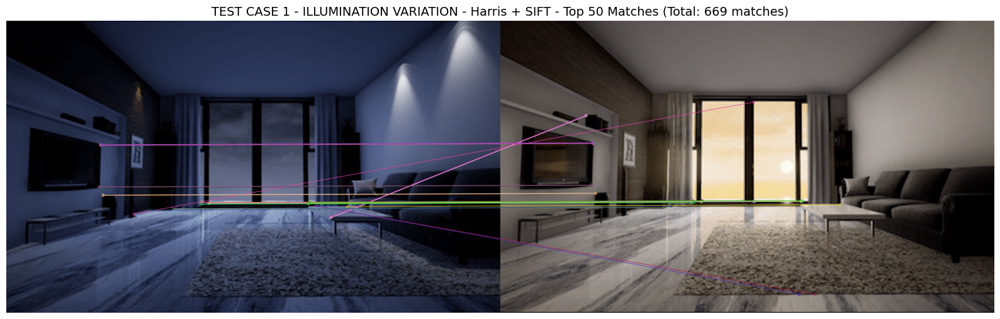

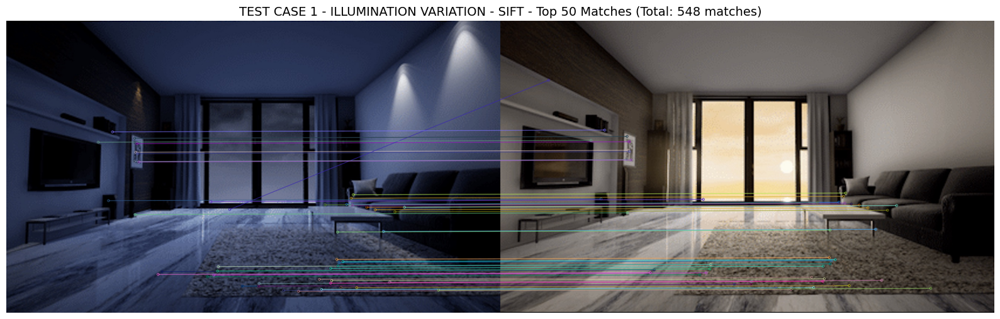

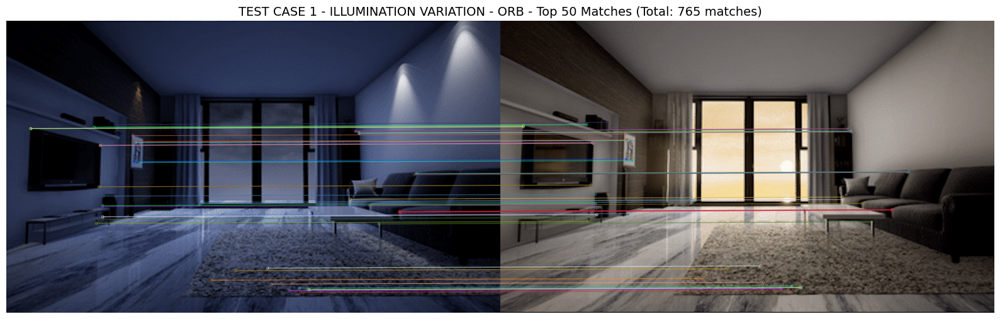


--------------------------------------------------------------------------------
SUMMARY - TEST CASE 1 - ILLUMINATION VARIATION
--------------------------------------------------------------------------------
Harris + SIFT        | KP1:  1212 | KP2:  5435 | Matches:   669
SIFT                 | KP1:   875 | KP2:  1547 | Matches:   548
ORB                  | KP1:  1916 | KP2:  2000 | Matches:   765
--------------------------------------------------------------------------------



In [18]:
img1_gray, img2_gray, img1_rgb, img2_rgb = load_image_pair(
    'data/matching/room-dark.jpg',
    'data/matching/room-light.jpg'
)

# # Display original images
# fig, axes = plt.subplots(1, 2, figsize=(14, 6))
# axes[0].imshow(img1_rgb)
# axes[0].set_title('Room - Dark Illumination', fontsize=12)
# axes[0].axis('off')
# axes[1].imshow(img2_rgb)
# axes[1].set_title('Room - Light Illumination', fontsize=12)
# axes[1].axis('off')
# plt.tight_layout()
# plt.show()

results_illumination = compare_methods(
    img1_gray, 
    img2_gray, 
    img1_rgb, 
    img2_rgb, 
    "TEST CASE 1 - ILLUMINATION VARIATION"
)


ANALYZING: TEST CASE 2 - SCALE VARIATION



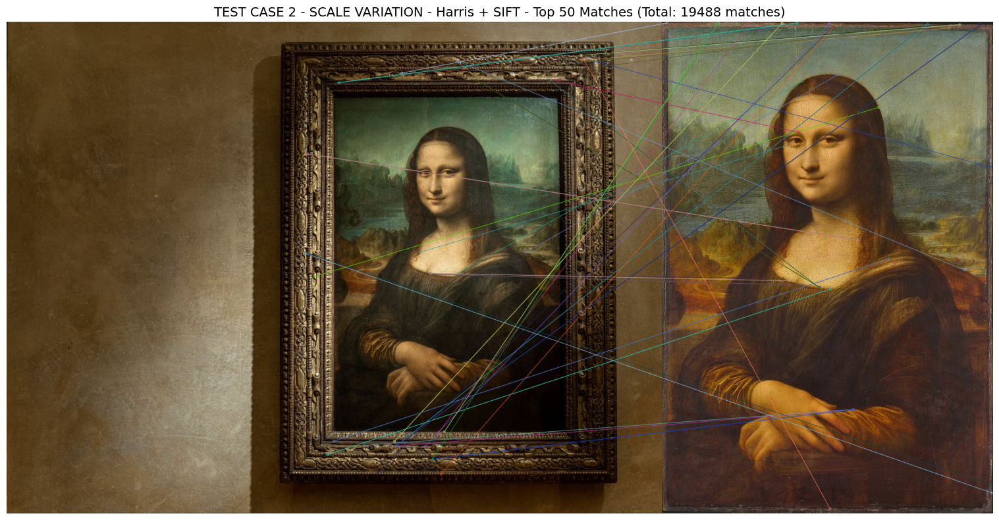

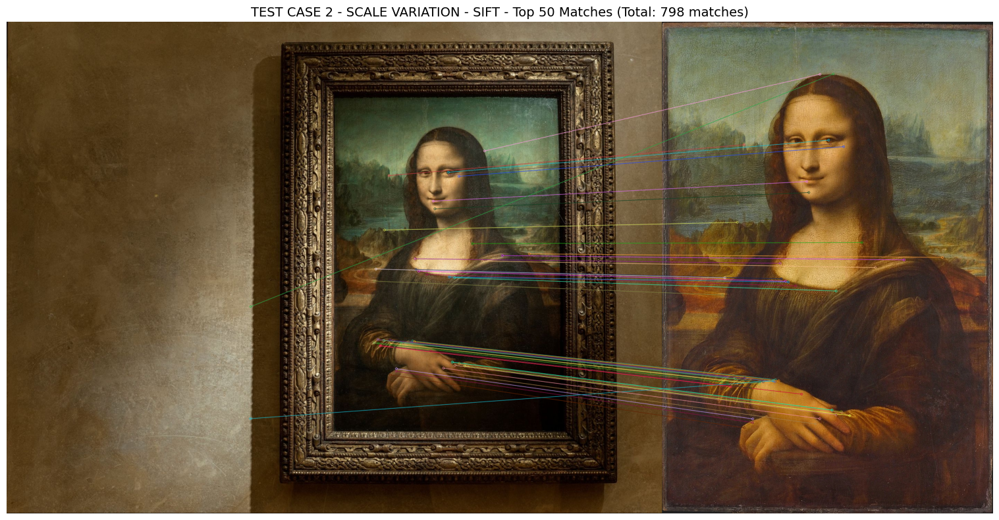

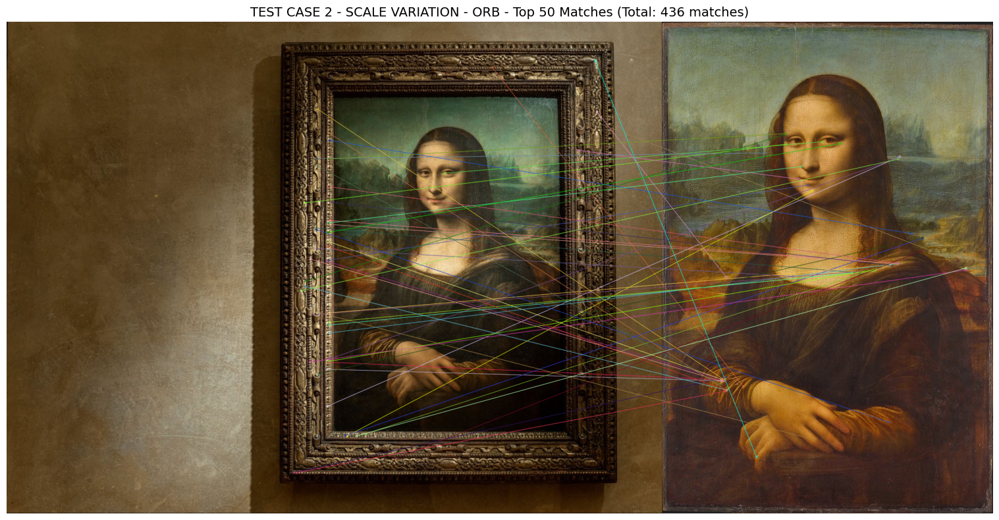


--------------------------------------------------------------------------------
SUMMARY - TEST CASE 2 - SCALE VARIATION
--------------------------------------------------------------------------------
Harris + SIFT        | KP1: 112561 | KP2: 57056 | Matches: 19488
SIFT                 | KP1: 11148 | KP2:  1435 | Matches:   798
ORB                  | KP1:  2000 | KP2:  1830 | Matches:   436
--------------------------------------------------------------------------------



In [19]:
img1_gray, img2_gray, img1_rgb, img2_rgb = load_image_pair(
    'data/matching/mona-lisa-complete.jpg',
    'data/matching/mona-lisa-closeup.jpg'
)

# # Display original images
# fig, axes = plt.subplots(1, 2, figsize=(14, 6))
# axes[0].imshow(img1_rgb)
# axes[0].set_title('Mona Lisa - Complete View', fontsize=12)
# axes[0].axis('off')
# axes[1].imshow(img2_rgb)
# axes[1].set_title('Mona Lisa - Close-up', fontsize=12)
# axes[1].axis('off')
# plt.tight_layout()
# plt.show()

results_scale = compare_methods(
    img1_gray, 
    img2_gray, 
    img1_rgb, 
    img2_rgb, 
    "TEST CASE 2 - SCALE VARIATION"
)


ANALYZING: TEST CASE 3: ROTATION/PERSPECTIVE VARIATION



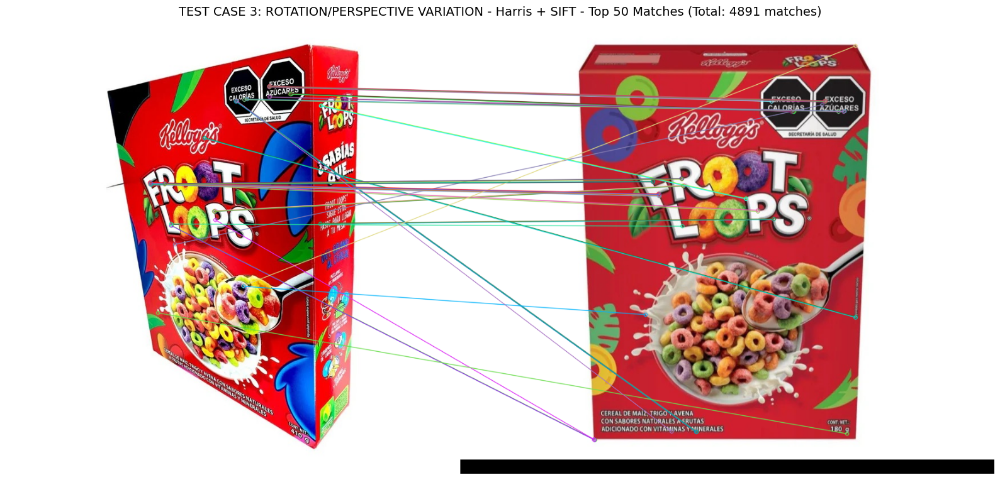

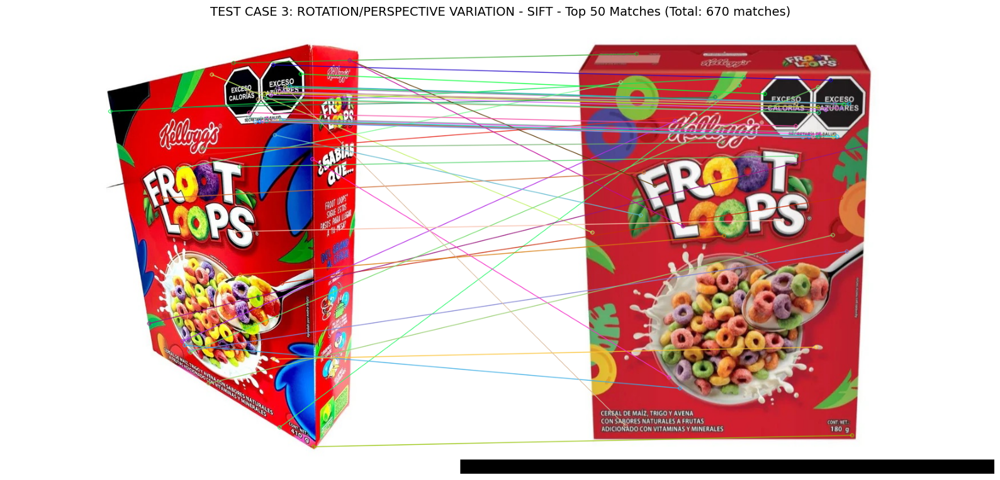

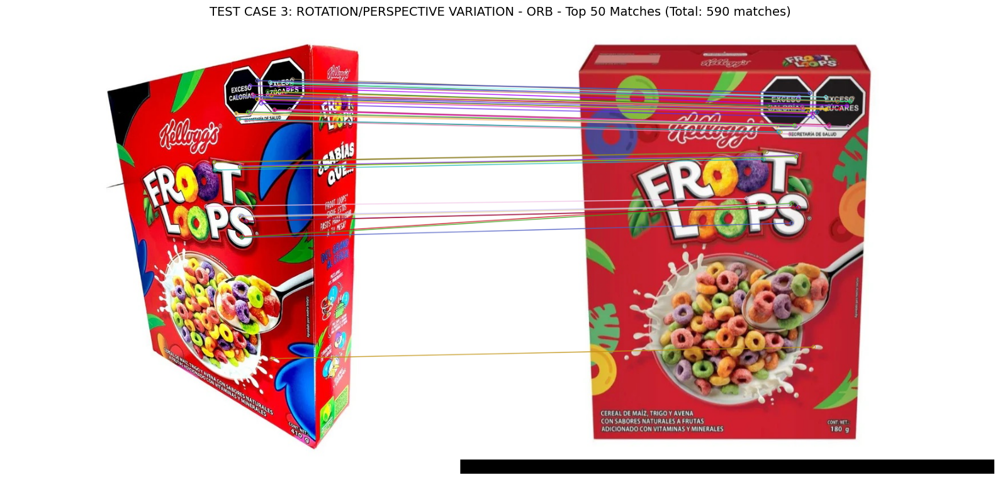


--------------------------------------------------------------------------------
SUMMARY - TEST CASE 3: ROTATION/PERSPECTIVE VARIATION
--------------------------------------------------------------------------------
Harris + SIFT        | KP1: 18464 | KP2: 16087 | Matches:  4891
SIFT                 | KP1:  1695 | KP2:  2237 | Matches:   670
ORB                  | KP1:  2000 | KP2:  2000 | Matches:   590
--------------------------------------------------------------------------------



In [20]:
img1_gray, img2_gray, img1_rgb, img2_rgb = load_image_pair(
    'data/matching/froot-loops-side.jpg',
    'data/matching/froot-loops-front.jpg'
)

# # Display original images
# fig, axes = plt.subplots(1, 2, figsize=(14, 6))
# axes[0].imshow(img1_rgb)
# axes[0].set_title('Froot Loops - Side View', fontsize=12)
# axes[0].axis('off')
# axes[1].imshow(img2_rgb)
# axes[1].set_title('Froot Loops - Front View', fontsize=12)
# axes[1].axis('off')
# plt.tight_layout()
# plt.show()

results_rotation = compare_methods(
    img1_gray, 
    img2_gray, 
    img1_rgb, 
    img2_rgb, 
    "TEST CASE 3: ROTATION/PERSPECTIVE VARIATION"
)

The experimental results reveal significant differences in the behavior of Harris corner detection combined with SIFT descriptors compared to pure SIFT and ORB approaches across three distinct image transformation scenarios. In the illumination variation test case, all three methods demonstrated reasonable robustness to lighting changes, with ORB achieving the highest number of matches (765) despite detecting fewer keypoints than Harris+SIFT. The Harris corner detector identified substantially more keypoints in the brighter image (5,435 vs. 1,212), suggesting sensitivity to intensity gradients that become more pronounced under better lighting conditions. This asymmetric detection behavior, while generating 669 matches, indicates that Harris corners may not be as stable across illumination changes as initially expected. Pure SIFT, although detecting fewer keypoints overall, produced 548 reliable matches with more balanced keypoint distribution between both images, demonstrating its inherent photometric invariance.

The scale variation experiment with the Mona Lisa images exposed a critical limitation of the Harris+SIFT combination. The Harris detector produced an extraordinarily high number of keypoints in the complete view (112,561) compared to the close-up (57,056), resulting in 19,488 matches (many of which appear to be false positives given the visual inspection of the matching patterns). This overwhelming keypoint density occurs because Harris detects corners at a single scale, causing it to identify numerous fine-grained texture details in high-resolution images that may not represent semantically meaningful features. In stark contrast, SIFT's multi-scale pyramid approach identified far fewer but more discriminative keypoints (11,148 and 1,435 respectively), yielding 798 matches that are geometrically more consistent. ORB maintained its controlled detection strategy with approximately 2,000 keypoints per image but struggled with the scale difference, producing only 436 matches. This clearly demonstrates that while Harris corners are computationally efficient, they lack the scale-space analysis necessary for robust matching across significant zoom variations.

In the rotation and perspective variation test with the Froot Loops cereal box, Harris+SIFT again detected significantly more keypoints (18,464 and 16,087) than the other methods, generating 4,891 matches. However, the visual quality of these matches suggests many are concentrated in highly textured regions (such as the colorful cereal loops and graphics) rather than being well-distributed across the entire object. SIFT produced 670 matches with more reasonable keypoint counts, while ORB achieved 590 matches, demonstrating that both methods effectively handled the perspective change through their orientation normalization mechanisms. The Harris detector's performance in this scenario highlights its strength in identifying corner-like structures in graphical content but also reveals its tendency toward over-detection in texture-rich regions. Overall, these results indicate that while the Harris+SIFT combination can generate numerous matches, the quality and geometric consistency of these matches may be inferior to pure SIFT, particularly when dealing with scale transformations. For practical applications requiring reliable feature matching under diverse conditions, SIFT remains the most robust choice despite its computational cost, while ORB offers an excellent balance for real-time scenarios where moderate accuracy is acceptable.